# OpenEQA QuickStart

Welcome! This notebook is intended to provide a quick-start guide to OpenEQA and its workflow. Before you can start using this notebook, please perform a few basic installation steps.

## Packages and Dependencies
- Install [openeqa](https://github.com/facebookresearch/open-eqa/blob/main/setup.py) and [required packages](https://github.com/facebookresearch/open-eqa/blob/main/requirements.txt).
- You don't need the full dataset to run this notebook and get started. But we highly encourage you to look at instructions to [download the data](https://github.com/facebookresearch/open-eqa/blob/main/data/README.md) and get started early! We realize getting access to the dataset has a few hoops to jump through and thus we provide this repo with a small "demo dataset" to give you a flavor of the benchmark.
- Get API access keys ready for different models (e.g. GPT, Claude) or host the model on your end (e.g. LLaMA, Mixtral).

## Data Visualization

Let's first start by visualizing a demo dataset generated from a [public HM3D scene](https://aihabitat.org/datasets/hm3d/).

In [1]:
import os
os.environ['OPENAI_API_KEY'] = 'cf016418d6b14bcb8165a11c97cf043e'
os.environ['OPENAI_AZURE_DEPLOYMENT'] = '1'

import matplotlib.pyplot as plt
from IPython.display import Video, Image

In [2]:
# HM3D Video
Video("/share/open-eqa/videos/hm3d-v0/000-hm3d-BFRyYbPCCPE-0.mp4", embed=True, width=480)

In [3]:
# Scannet Video
Video("/share/open-eqa/videos/scannet-v0/002-scannet-scene0709_00-0.mp4", embed=True, width=480)

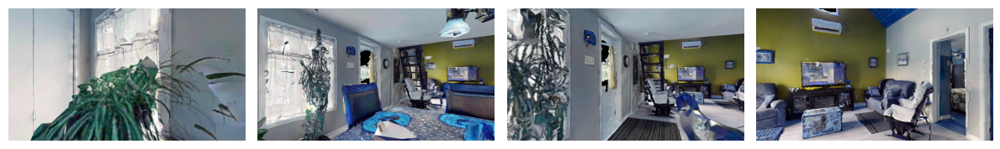

In [4]:
from PIL import Image
from tqdm import tqdm

from openeqa.utils.demo_utils import (
    decode_frames_from_video_path,
    get_equally_spaced_frames,
)

frames_per_traj = 15

# get the frames from the video
frames = decode_frames_from_video_path("/share/open-eqa/videos/hm3d-v0/000-hm3d-BFRyYbPCCPE-0.mp4")

# extract equally spaced frames
frames = get_equally_spaced_frames(frames, frames_per_traj)

# display a few frames
_, axs = plt.subplots(1, 4, figsize=(12, 12))
for img, ax in zip(frames[::4], axs):
    ax.axis("off")
    ax.imshow(img)
plt.tight_layout()
plt.show()

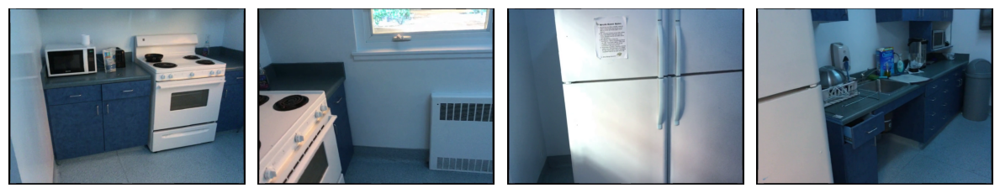

In [5]:
from PIL import Image
from tqdm import tqdm

from openeqa.utils.demo_utils import (
    decode_frames_from_video_path,
    get_equally_spaced_frames,
)

frames_per_traj = 15

# get the frames from the video
frames = decode_frames_from_video_path("/share/open-eqa/videos/scannet-v0/002-scannet-scene0709_00-0.mp4")

# extract equally spaced frames
frames = get_equally_spaced_frames(frames, frames_per_traj)

# display a few frames
_, axs = plt.subplots(1, 4, figsize=(12, 12))
for img, ax in zip(frames[::4], axs):
    ax.axis("off")
    ax.imshow(img)
plt.tight_layout()
plt.show()

## Load the Questions

In [6]:
import json

eqa_data = json.load(open("data/open-eqa-v0.json"))
print(f'#EQA : {len(eqa_data)} instances')
print('\nTop-3 & Bottom-3 Samples:')
print(json.dumps(eqa_data[:3] + eqa_data[-3:], indent=2))

#EQA : 1636 instances

Top-3 & Bottom-3 Samples:
[
  {
    "question": "What is the white object on the wall above the TV?",
    "answer": "Air conditioning unit",
    "category": "object recognition",
    "question_id": "f2e82760-5c3c-41b1-88b6-85921b9e7b32",
    "episode_history": "hm3d-v0/000-hm3d-BFRyYbPCCPE"
  },
  {
    "question": "What material is the ceiling in the living room?",
    "answer": "Wood panel",
    "category": "attribute recognition",
    "question_id": "7447d782-d1a7-4c87-86dc-b5eafc5a0f76",
    "episode_history": "hm3d-v0/000-hm3d-BFRyYbPCCPE"
  },
  {
    "question": "What color is the staircase railing?",
    "answer": "Brown",
    "category": "attribute recognition",
    "question_id": "e2ccf6f4-22a9-47d1-ab8d-a05a13435b82",
    "episode_history": "hm3d-v0/000-hm3d-BFRyYbPCCPE"
  },
  {
    "question": "There's something written on the whiteboard, what does it look to you?",
    "answer": "Math Equations",
    "category": "world knowledge",
    "question_id":

## Ask the Model

Let's start with a text-only (or blind) LLM. We'll use GPT-4 for illustration, but we encourage you to try out your own model!

First set the OPENAI_API_KEY environment variable to your own openai api key.

In [7]:
assert "OPENAI_API_KEY" in os.environ
if os.environ.get('OPENAI_AZURE_DEPLOYMENT') == '1':
    from openeqa.baselines.gpt4_azure import ask_question as ask_blind_gpt4
else:
    from openeqa.baselines.gpt4 import ask_question as ask_blind_gpt4

verbose = True

for item in tqdm(eqa_data[:3] + eqa_data[-3:]):
    q = item["question"]
    a = item["answer"]
    blind_gpt4_a = ask_blind_gpt4(
        question=q,
        openai_model="gpt-4o",
    )
    item["blind_gpt4_answer"] = blind_gpt4_a
    if verbose:
        # print the question and the model's answer
        print("Q: {}\nA: {}\n".format(q, blind_gpt4_a))

 17%|████████████████████████████▏                                                                                                                                            | 1/6 [00:18<01:31, 18.30s/it]

Q: What is the white object on the wall above the TV?
A: a clock



 33%|████████████████████████████████████████████████████████▎                                                                                                                | 2/6 [00:19<00:33,  8.40s/it]

Q: What material is the ceiling in the living room?
A: Drywall



 50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3/6 [00:20<00:15,  5.11s/it]

Q: What color is the staircase railing?
A: brown



 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4/6 [00:22<00:07,  3.71s/it]

Q: There's something written on the whiteboard, what does it look to you?
A: It looks like a mix of handwritten notes, diagrams, and possibly some bullet points.



 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5/6 [00:23<00:02,  2.79s/it]

Q: Where is the blue trash can?
A: In the kitchen.



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:25<00:00,  4.17s/it]

Q: Where is the clock?
A: On the wall.



Next, lets try a multi-modal LLM. We'll use GPT-4V, but other models are implemented in the open-eqa codebase. 

In [8]:
assert "OPENAI_API_KEY" in os.environ
import glob

if os.environ.get('OPENAI_AZURE_DEPLOYMENT') == '1':
    from openeqa.baselines.gpt4o_azure import ask_question as ask_gpt4o
else:
    from openeqa.baselines.gpt4v import ask_question as ask_gpt4o

verbose = True

for item in tqdm(eqa_data[:3] + eqa_data[-3:]):
    q = item["question"]
    image_paths = sorted(glob.glob(f"/share/open-eqa/frames/{item['episode_history']}/*.png"))
    filt_image_paths = []
    for depth_img, rgb_img in zip(image_paths[::30], image_paths[1::30]):
        filt_image_paths.append(depth_img)
        filt_image_paths.append(rgb_img)
    
    gpt4o_a = ask_gpt4o(
        question=q,
        image_paths=filt_image_paths,
        openai_key=os.environ["OPENAI_API_KEY"],
        openai_model="gpt-4o",
    )
    item["gpt4o_answer"] = gpt4o_a
    if verbose:
        # print the question and the model's answer
        print("Q: {}\nA: {}\n".format(q, gpt4o_a))

 17%|████████████████████████████▏                                                                                                                                            | 1/6 [00:05<00:28,  5.61s/it]

Q: What is the white object on the wall above the TV?
A: The white object on the wall above the TV is an air conditioning unit.



 33%|████████████████████████████████████████████████████████▎                                                                                                                | 2/6 [00:14<00:29,  7.48s/it]

Q: What material is the ceiling in the living room?
A: The ceiling in the living room appears to be made of wood.



 50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3/6 [00:23<00:24,  8.24s/it]

Q: What color is the staircase railing?
A: The staircase railing is dark brown.



 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4/6 [01:15<00:51, 25.64s/it]

Q: There's something written on the whiteboard, what does it look to you?
A: The whiteboard has some text written on it, but the images are not clear enough to read the exact content. However, it appears to have some notes or bullet points, possibly related to a meeting or a lecture.



 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5/6 [02:35<00:44, 44.94s/it]

Q: Where is the blue trash can?
A: The blue trash can is located next to the bookshelf on the left side of the room, near the whiteboard.



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [03:05<00:00, 30.92s/it]

Q: Where is the clock?
A: The clock is located on the wall above the windows at the far end of the room.



## Evaluate the Answers w/ LLM-Match

Finally, we'll evaluate the open-vocabulary answers produced by an LLMs or multi-modal LLMs by comparing against the ground truth answer(s) using LLM-Match, which uses a rating of 1-5 to score answers. See the paper for more details.

In [9]:
assert "OPENAI_API_KEY" in os.environ
from openeqa.evaluation.llm_match import get_llm_match_score

# evaluate GPT-4 answers
for item in tqdm(eqa_data[:3] + eqa_data[-3:]):
    c = get_llm_match_score(
        question=item["question"],
        answer=item["answer"],
        prediction=item["blind_gpt4_answer"],
    )  # correctness score (see Eq. 1 and Table 2 in paper)
    item["blind_gpt4_score"] = c

# evaluate GPT-4o answers
for item in tqdm(eqa_data[:3] + eqa_data[-3:]):
    c = get_llm_match_score(
        question=item["question"],
        answer=item["answer"],
        prediction=item["gpt4o_answer"],
    )  # correctness score (see Eq. 1 and Table 2 in paper)
    item["gpt4o_score"] = c

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.03s/it]


In [10]:
# print the final results
print(json.dumps(eqa_data[:3] + eqa_data[-3:], indent=2))

[
  {
    "question": "What is the white object on the wall above the TV?",
    "answer": "Air conditioning unit",
    "category": "object recognition",
    "question_id": "f2e82760-5c3c-41b1-88b6-85921b9e7b32",
    "episode_history": "hm3d-v0/000-hm3d-BFRyYbPCCPE",
    "blind_gpt4_answer": "a clock",
    "gpt4o_answer": "The white object on the wall above the TV is an air conditioning unit.",
    "blind_gpt4_score": 1,
    "gpt4o_score": 5
  },
  {
    "question": "What material is the ceiling in the living room?",
    "answer": "Wood panel",
    "category": "attribute recognition",
    "question_id": "7447d782-d1a7-4c87-86dc-b5eafc5a0f76",
    "episode_history": "hm3d-v0/000-hm3d-BFRyYbPCCPE",
    "blind_gpt4_answer": "Drywall",
    "gpt4o_answer": "The ceiling in the living room appears to be made of wood.",
    "blind_gpt4_score": 1,
    "gpt4o_score": 4
  },
  {
    "question": "What color is the staircase railing?",
    "answer": "Brown",
    "category": "attribute recognition",
